# Satellite Images of Water Bodies

1. Dataset<br>
A collection of water bodies images captured by the Sentinel-2 Satellite. Each image comes with a black and white mask where white represents water and black represents something else but water.<br>
Data comes from Kaggle: https://www.kaggle.com/datasets/franciscoescobar/satellite-images-of-water-bodies

2. Project<br>
The goal of this project was to use a standard U-net implementation for image segmentation, more specifically, to train the network to recognize and locate bodies of water on the image.


In [1]:
from google.colab import drive
drive.mount('/content/drive/')

ModuleNotFoundError: No module named 'google'

In [7]:
import os
import numpy as np
from tqdm import tqdm
import cv2 as cv
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from keras import Model
from keras.callbacks import Callback
from keras.optimizers import Adam
from keras.utils import plot_model
from keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate, Dropout

In [3]:
# Unpack data
!tar xf /content/drive/MyDrive/unet/archive.tar.gz -C /content

In [8]:
image_path = 'Water Bodies Dataset/Images/'
mask_path = 'Water Bodies Dataset/Masks/'
SIZE = 128

In [9]:
# lists of images and masks names
image_names = sorted(next(os.walk(image_path))[-1])
mask_names = sorted(next(os.walk(mask_path))[-1])

images = np.zeros(shape=(len(image_names),SIZE, SIZE, 3))
masks = np.zeros(shape=(len(image_names),SIZE, SIZE, 1))

for id in tqdm(range(len(image_names)), desc="Images"):
  path = image_path + image_names[id]
  img = np.asarray(Image.open(path)).astype('float')/255.
  img = cv.resize(img, (SIZE,SIZE), cv.INTER_AREA)
  images[id] = img

for id in tqdm(range(len(mask_names)), desc="Mask"):
  path = mask_path + mask_names[id]
  mask = np.asarray(Image.open(path)).astype('float')/255.
  mask = cv.resize(mask, (SIZE,SIZE), cv.INTER_AREA)
  masks[id] = mask[:,:,:1]

Mask: 100%|██████████| 2841/2841 [00:43<00:00, 65.39it/s] 


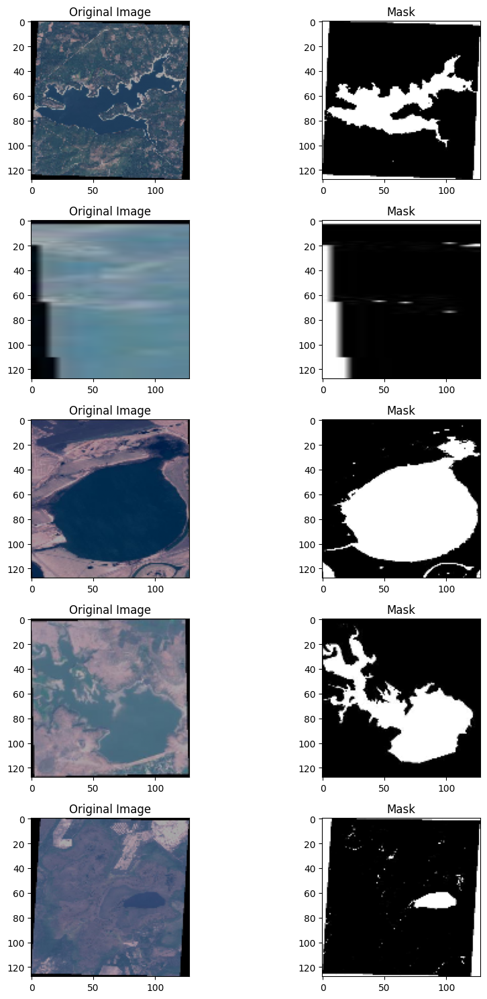

In [11]:
# Plot some images and its masks
plt.figure(figsize=(10,15))
for i in range(1,11):
  plt.subplot(5,2,i)

  if i%2!=0:
    id = np.random.randint(len(images))
    plt.imshow(images[id], cmap=None)
    plt.title('Original Image')
  elif i%2==0:
    plt.imshow(masks[id].reshape(128,128), cmap='gray')
    plt.title('Mask')

plt.tight_layout()
plt.show()

In [12]:
# Train test split
images_train, images_test, mask_train, mask_test = train_test_split(images, masks, test_size=0.25)

In [13]:
# Define U-net architecture
def unet_model(input_layer, start_neurons):
    # Contraction path
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(input_layer)
    conv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(conv1)
    pool1 = MaxPooling2D((2, 2))(conv1)
    pool1 = Dropout(0.25)(pool1)

    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(pool1)
    conv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)
    pool2 = Dropout(0.5)(pool2)

    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(pool2)
    conv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(conv3)
    pool3 = MaxPooling2D((2, 2))(conv3)
    pool3 = Dropout(0.5)(pool3)

    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(pool3)
    conv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(conv4)
    pool4 = MaxPooling2D((2, 2))(conv4)
    pool4 = Dropout(0.5)(pool4)

    # Middle
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(pool4)
    convm = Conv2D(start_neurons*16, kernel_size=(3, 3), activation="relu", padding="same")(convm)
    
    # Expansive path
    deconv4 = Conv2DTranspose(start_neurons*8, kernel_size=(3, 3), strides=(2, 2), padding="same")(convm)
    uconv4 = concatenate([deconv4, conv4])
    uconv4 = Dropout(0.5)(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)
    uconv4 = Conv2D(start_neurons*8, kernel_size=(3, 3), activation="relu", padding="same")(uconv4)

    deconv3 = Conv2DTranspose(start_neurons*4, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv4)
    uconv3 = concatenate([deconv3, conv3])
    uconv3 = Dropout(0.5)(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)
    uconv3 = Conv2D(start_neurons*4, kernel_size=(3, 3), activation="relu", padding="same")(uconv3)

    deconv2 = Conv2DTranspose(start_neurons*2, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv3)
    uconv2 = concatenate([deconv2, conv2])
    uconv2 = Dropout(0.5)(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)
    uconv2 = Conv2D(start_neurons*2, kernel_size=(3, 3), activation="relu", padding="same")(uconv2)

    deconv1 = Conv2DTranspose(start_neurons*1, kernel_size=(3, 3), strides=(2, 2), padding="same")(uconv2)
    uconv1 = concatenate([deconv1, conv1])
    uconv1 = Dropout(0.5)(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)
    uconv1 = Conv2D(start_neurons, kernel_size=(3, 3), activation="relu", padding="same")(uconv1)
    
    # Last conv and output
    output_layer = Conv2D(1, (1,1), padding="same", activation="sigmoid")(uconv1)
    
    return output_layer

In [14]:
# Compile unet model
input_layer = Input((SIZE, SIZE, 3))
output_layer = unet_model(input_layer = input_layer, start_neurons = 16)

model = Model(input_layer, output_layer)
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │        448 │ input_layer[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │      2,320 │ conv2d[0][0]      │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 64, 64,    │          0 │ max_pooling2d[0]… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │      4,640 │ dropout[0][0]     │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │      9,248 │ conv2d_2[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 32, 32,    │          0 │ max_pooling2d_1[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 32,    │     18,496 │ dropout_1[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 32, 32,    │     36,928 │ conv2d_4[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 16, 16,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 16, 16,    │          0 │ max_pooling2d_2[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 16, 16,    │     73,856 │ dropout_2[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 16, 16,    │    147,584 │ conv2d_6[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 8, 8, 128) │          0 │ conv2d_7[0][0]    │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 8, 8, 128) │          0 │ max_pooling2d_3[

 Total params: 2,158,705 (8.23 MB)

 Trainable params: 2,158,705 (8.23 MB)

 Non-trainable params: 0 (0.00 B)

In [15]:
# Post Process
def mask_threshold(image, threshold=0.25):
  return image>threshold

# Callback to show progress of learning on the images after each epoch
class ShowProgress(Callback):
  def __init__(self, save=False):
    self.save = save
  def on_epoch_end(self, epoch, logs=None):
    k = np.random.randint(len(images_train))
    original_image = images_train[k][np.newaxis,...]
    predicted_mask = self.model.predict(original_image).reshape(128,128)
    proc_mask02 = mask_threshold(predicted_mask, threshold=0.2)
    proc_mask03 = mask_threshold(predicted_mask, threshold=0.3)
    proc_mask04 = mask_threshold(predicted_mask, threshold=0.4)
    proc_mask05 = mask_threshold(predicted_mask, threshold=0.5)
    mask = mask_train[k].reshape(128,128)

    plt.figure(figsize=(15,10))

    plt.subplot(1,7,1)
    plt.imshow(original_image[0]);plt.title('Orginal Image')

    plt.subplot(1,7,2)
    plt.imshow(predicted_mask, cmap='gray');plt.title('Predicted Mask')
    
    plt.subplot(1,7,3)
    plt.imshow(mask, cmap='gray');plt.title('Orginal Mask')

    plt.subplot(1,7,4)
    plt.imshow(proc_mask02, cmap='gray');plt.title('Processed: 0.2')

    plt.subplot(1,7,5)
    plt.imshow(proc_mask03, cmap='gray');plt.title('Processed: 0.3')

    plt.subplot(1,7,6)
    plt.imshow(proc_mask04, cmap='gray');plt.title('Processed: 0.4')

    plt.subplot(1,7,6)
    plt.imshow(proc_mask05, cmap='gray');plt.title('Processed: 0.5')

    plt.tight_layout()
    plt.show()

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/stepep - accuracy: 0.5476 - loss: 0.59


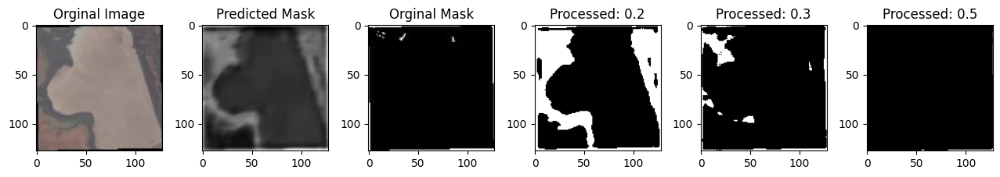

67/67 ━━━━━━━━━━━━━━━━━━━━ 24s 305ms/step - accuracy: 0.5481 - loss: 0.5924 - val_accuracy: 0.6336 - val_loss: 0.5003
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/steptep - accuracy: 0.6340 - loss: 0.490


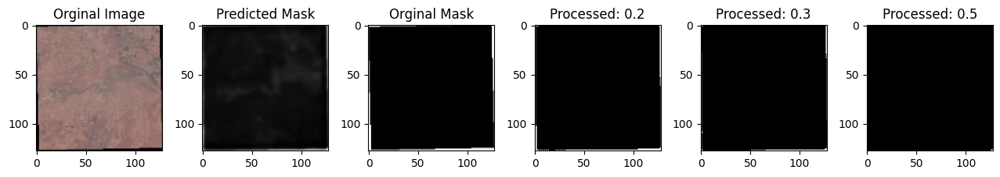

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 293ms/step - accuracy: 0.6340 - loss: 0.4905 - val_accuracy: 0.6516 - val_loss: 0.4671
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/steptep - accuracy: 0.6395 - loss: 0.479


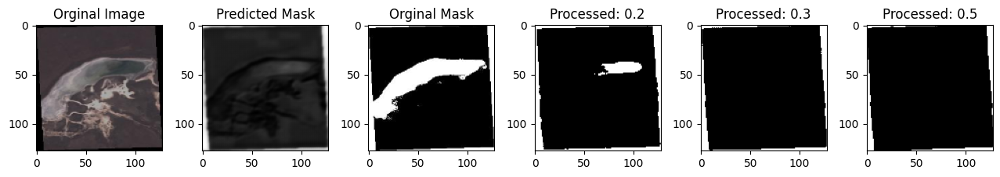

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 302ms/step - accuracy: 0.6395 - loss: 0.4797 - val_accuracy: 0.6493 - val_loss: 0.4555
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/steptep - accuracy: 0.6390 - loss: 0.470


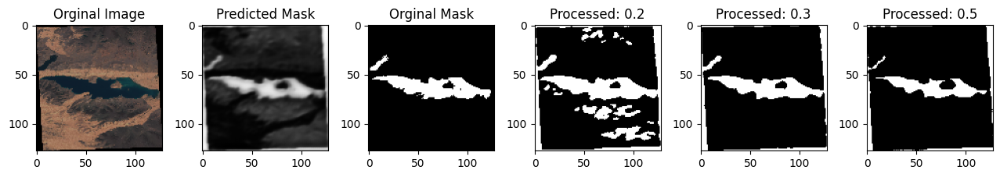

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 299ms/step - accuracy: 0.6392 - loss: 0.4699 - val_accuracy: 0.6607 - val_loss: 0.4335
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/steptep - accuracy: 0.6583 - loss: 0.435


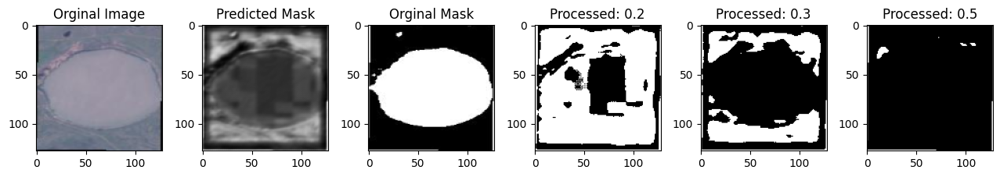

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 300ms/step - accuracy: 0.6583 - loss: 0.4353 - val_accuracy: 0.6788 - val_loss: 0.4034
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/steptep - accuracy: 0.6616 - loss: 0.420


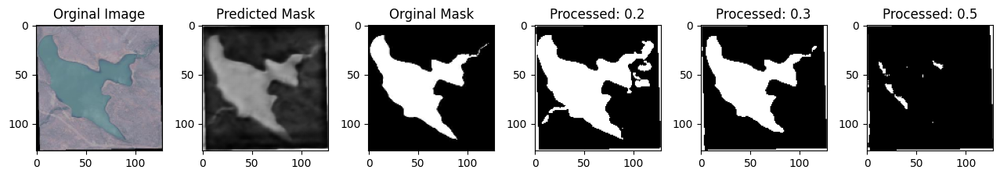

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 299ms/step - accuracy: 0.6616 - loss: 0.4210 - val_accuracy: 0.6648 - val_loss: 0.4143
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/steptep - accuracy: 0.6772 - loss: 0.406


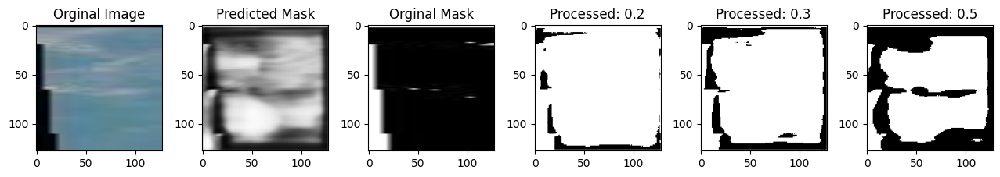

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 287ms/step - accuracy: 0.6771 - loss: 0.4060 - val_accuracy: 0.6890 - val_loss: 0.3745
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/steptep - accuracy: 0.6782 - loss: 0.407


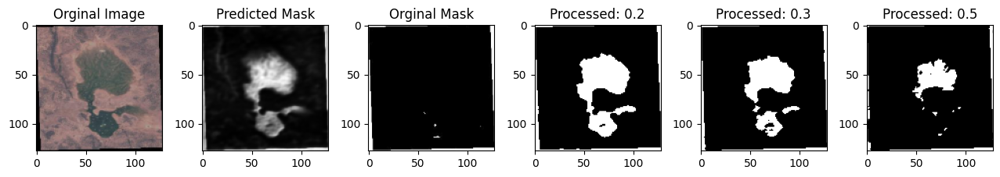

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 293ms/step - accuracy: 0.6782 - loss: 0.4070 - val_accuracy: 0.6953 - val_loss: 0.3591
Epoch 9/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/steptep - accuracy: 0.6866 - loss: 0.390


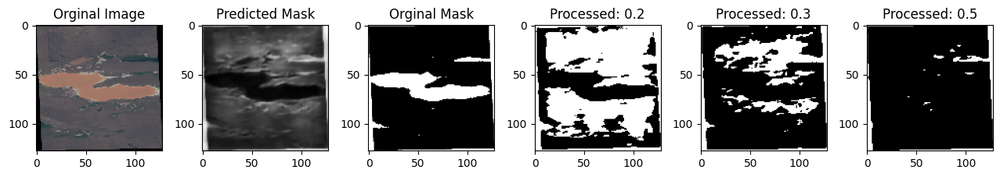

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 285ms/step - accuracy: 0.6866 - loss: 0.3908 - val_accuracy: 0.6961 - val_loss: 0.3716
Epoch 10/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/steptep - accuracy: 0.6882 - loss: 0.372


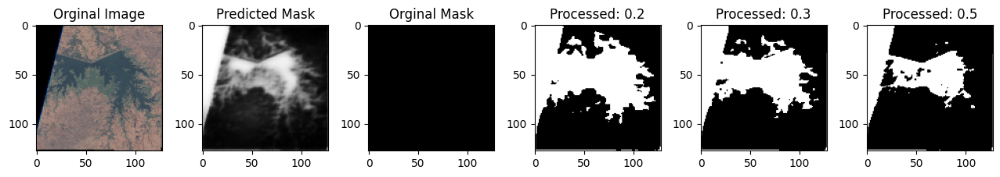

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 288ms/step - accuracy: 0.6882 - loss: 0.3724 - val_accuracy: 0.6957 - val_loss: 0.3546
Epoch 11/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/steptep - accuracy: 0.7055 - loss: 0.349


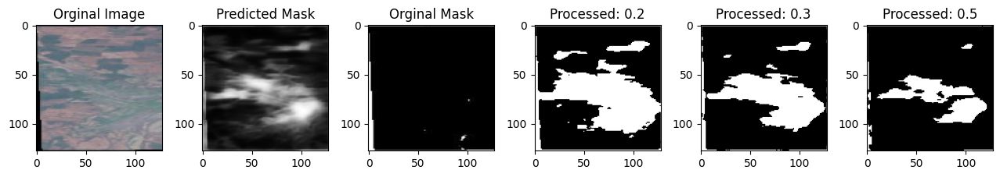

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 290ms/step - accuracy: 0.7054 - loss: 0.3498 - val_accuracy: 0.7079 - val_loss: 0.3367
Epoch 12/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/steptep - accuracy: 0.7057 - loss: 0.341


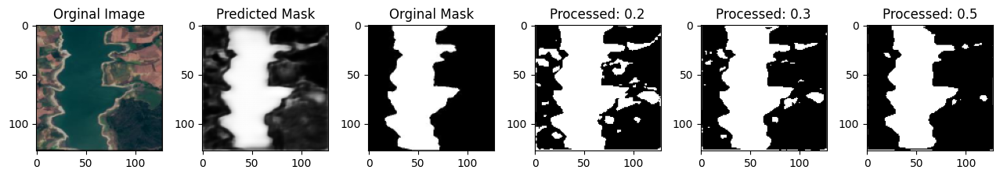

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 293ms/step - accuracy: 0.7057 - loss: 0.3412 - val_accuracy: 0.7116 - val_loss: 0.3203
Epoch 13/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/steptep - accuracy: 0.7034 - loss: 0.349


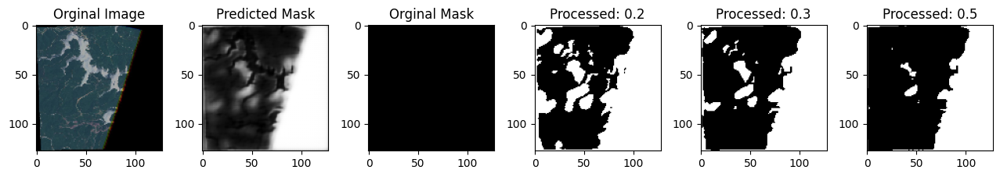

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 295ms/step - accuracy: 0.7033 - loss: 0.3495 - val_accuracy: 0.7080 - val_loss: 0.3302
Epoch 14/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/steptep - accuracy: 0.6972 - loss: 0.349


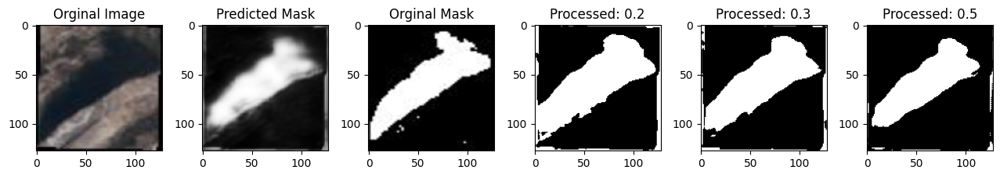

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 294ms/step - accuracy: 0.6973 - loss: 0.3491 - val_accuracy: 0.7154 - val_loss: 0.3163
Epoch 15/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/steptep - accuracy: 0.7070 - loss: 0.335


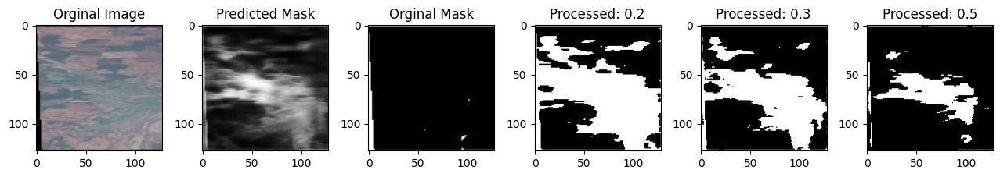

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 294ms/step - accuracy: 0.7069 - loss: 0.3352 - val_accuracy: 0.7092 - val_loss: 0.3304
Epoch 16/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/steptep - accuracy: 0.7095 - loss: 0.329


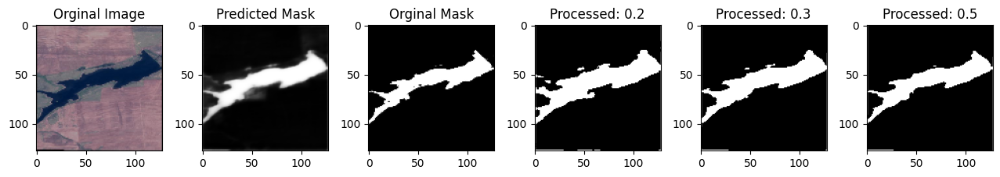

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 284ms/step - accuracy: 0.7095 - loss: 0.3295 - val_accuracy: 0.7155 - val_loss: 0.3085
Epoch 17/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/steptep - accuracy: 0.7158 - loss: 0.323


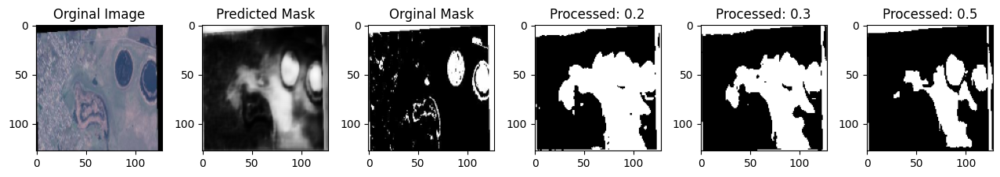

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 293ms/step - accuracy: 0.7158 - loss: 0.3230 - val_accuracy: 0.7188 - val_loss: 0.3109
Epoch 18/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/steptep - accuracy: 0.7144 - loss: 0.311


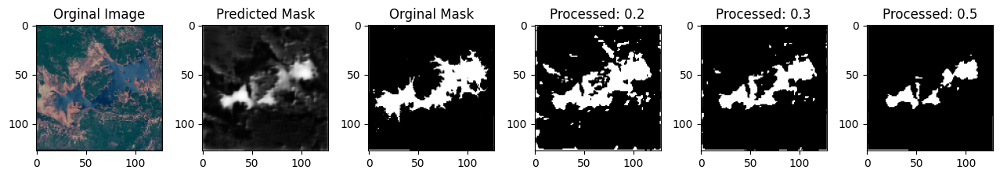

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 299ms/step - accuracy: 0.7144 - loss: 0.3120 - val_accuracy: 0.7167 - val_loss: 0.3140
Epoch 19/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/steptep - accuracy: 0.7278 - loss: 0.297


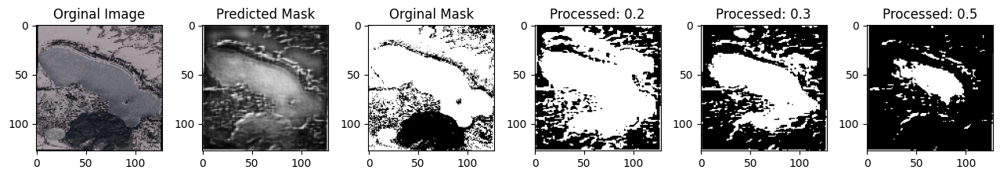

67/67 ━━━━━━━━━━━━━━━━━━━━ 22s 328ms/step - accuracy: 0.7276 - loss: 0.2978 - val_accuracy: 0.6910 - val_loss: 0.3698
Epoch 20/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/steptep - accuracy: 0.7037 - loss: 0.337


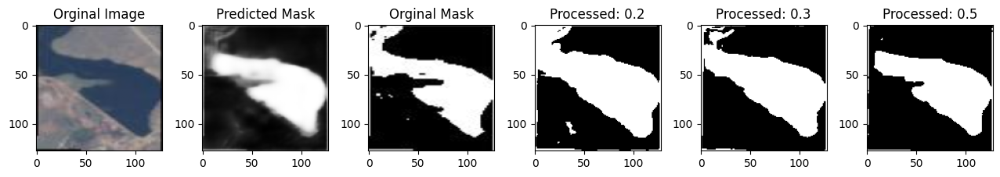

67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 315ms/step - accuracy: 0.7038 - loss: 0.3370 - val_accuracy: 0.7205 - val_loss: 0.2999
Epoch 21/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/steptep - accuracy: 0.7112 - loss: 0.316


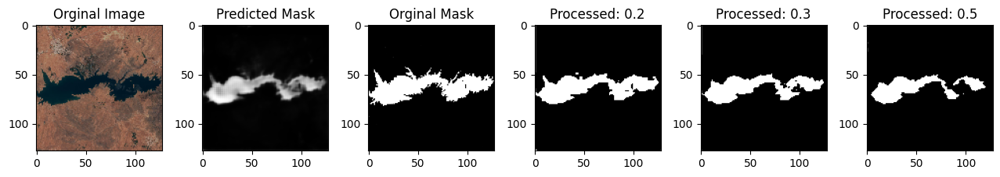

67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 315ms/step - accuracy: 0.7112 - loss: 0.3166 - val_accuracy: 0.6859 - val_loss: 0.4480
Epoch 22/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/steptep - accuracy: 0.6301 - loss: 0.505


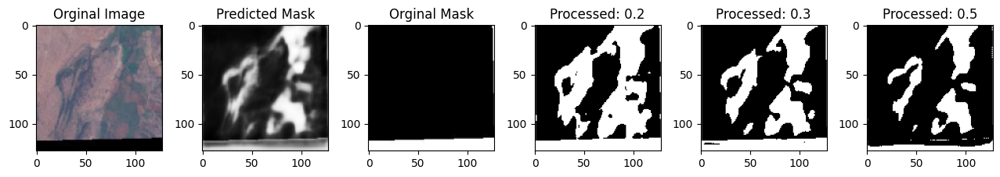

67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 312ms/step - accuracy: 0.6303 - loss: 0.5049 - val_accuracy: 0.6802 - val_loss: 0.4032
Epoch 23/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/steptep - accuracy: 0.6829 - loss: 0.399


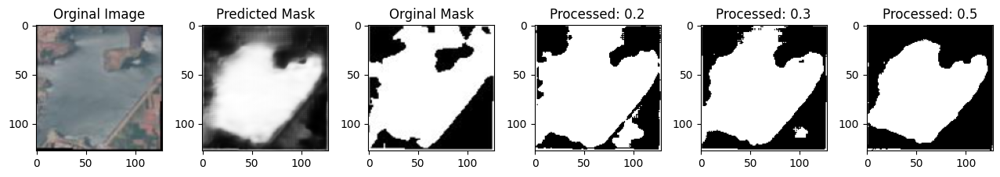

67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 313ms/step - accuracy: 0.6829 - loss: 0.3994 - val_accuracy: 0.6988 - val_loss: 0.3575
Epoch 24/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/steptep - accuracy: 0.6923 - loss: 0.362


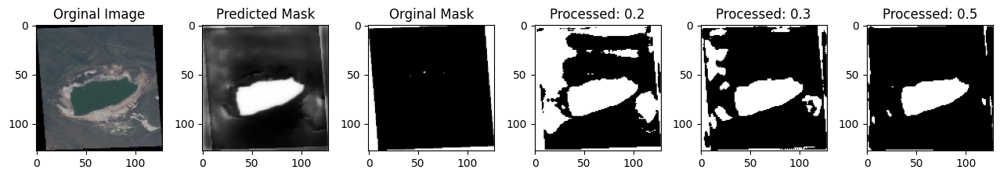

67/67 ━━━━━━━━━━━━━━━━━━━━ 22s 323ms/step - accuracy: 0.6923 - loss: 0.3627 - val_accuracy: 0.7123 - val_loss: 0.3319
Epoch 25/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/steptep - accuracy: 0.7001 - loss: 0.350


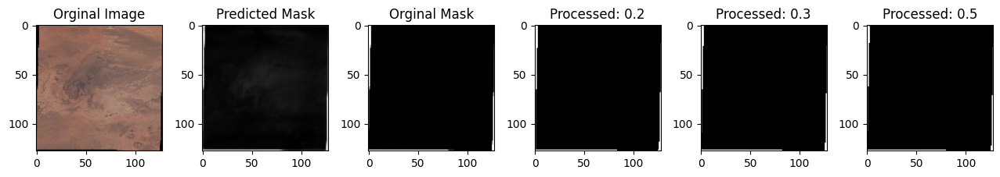

67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 315ms/step - accuracy: 0.7001 - loss: 0.3501 - val_accuracy: 0.7004 - val_loss: 0.3485
Epoch 26/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/steptep - accuracy: 0.6997 - loss: 0.346


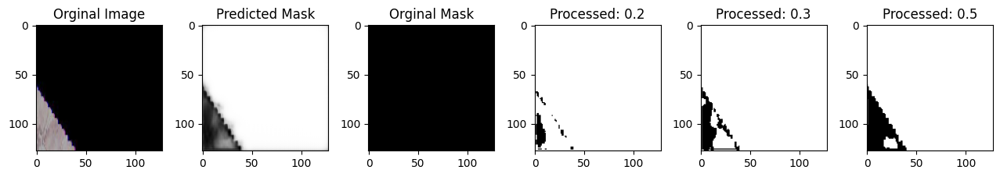

67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 315ms/step - accuracy: 0.6998 - loss: 0.3463 - val_accuracy: 0.7141 - val_loss: 0.3171
Epoch 27/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/steptep - accuracy: 0.7139 - loss: 0.322


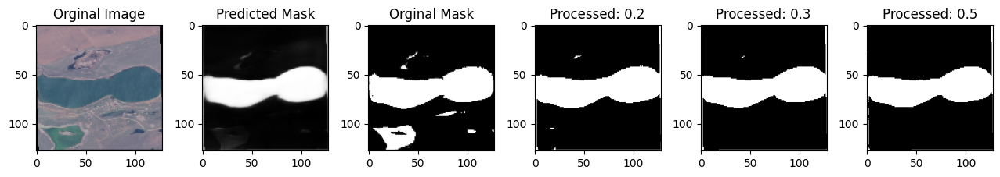

67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 313ms/step - accuracy: 0.7138 - loss: 0.3227 - val_accuracy: 0.7176 - val_loss: 0.3109
Epoch 28/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/steptep - accuracy: 0.7119 - loss: 0.311


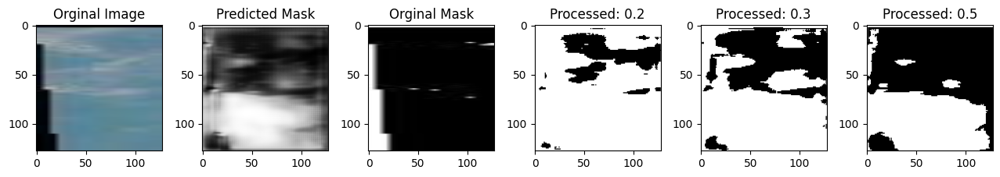

67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 314ms/step - accuracy: 0.7120 - loss: 0.3117 - val_accuracy: 0.7082 - val_loss: 0.3277
Epoch 29/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/steptep - accuracy: 0.7187 - loss: 0.301


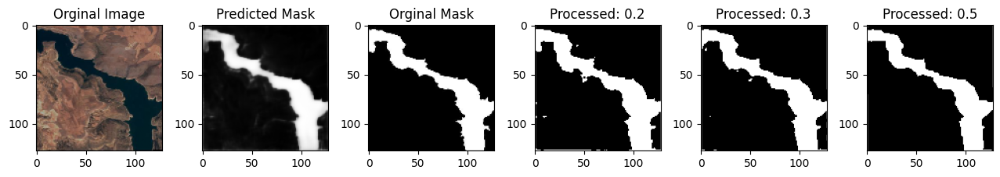

67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 314ms/step - accuracy: 0.7188 - loss: 0.3019 - val_accuracy: 0.7215 - val_loss: 0.2968
Epoch 30/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/steptep - accuracy: 0.7220 - loss: 0.295


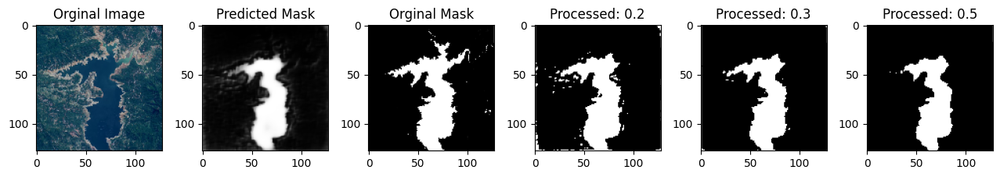

67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 316ms/step - accuracy: 0.7220 - loss: 0.2954 - val_accuracy: 0.7247 - val_loss: 0.2904
Epoch 31/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/steptep - accuracy: 0.7211 - loss: 0.296


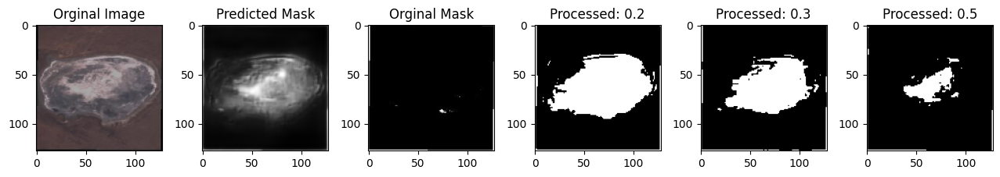

67/67 ━━━━━━━━━━━━━━━━━━━━ 22s 321ms/step - accuracy: 0.7211 - loss: 0.2963 - val_accuracy: 0.7271 - val_loss: 0.2839
Epoch 32/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/steptep - accuracy: 0.7241 - loss: 0.290


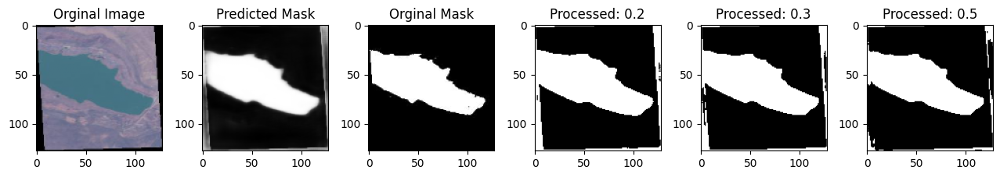

67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 310ms/step - accuracy: 0.7241 - loss: 0.2903 - val_accuracy: 0.7203 - val_loss: 0.3044
Epoch 33/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/steptep - accuracy: 0.7145 - loss: 0.299


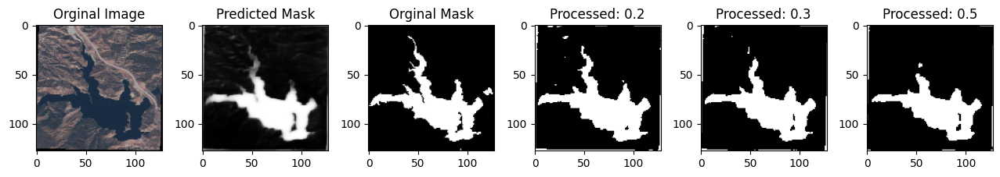

67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 313ms/step - accuracy: 0.7147 - loss: 0.2995 - val_accuracy: 0.7284 - val_loss: 0.2861
Epoch 34/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/steptep - accuracy: 0.7321 - loss: 0.275


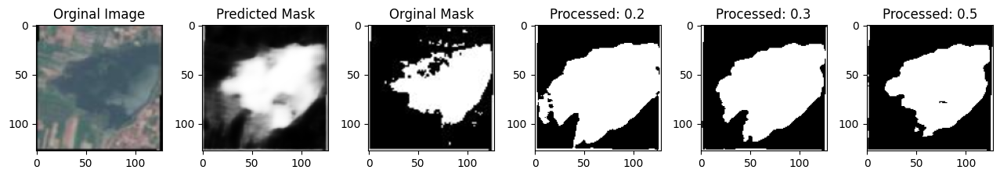

67/67 ━━━━━━━━━━━━━━━━━━━━ 22s 324ms/step - accuracy: 0.7320 - loss: 0.2759 - val_accuracy: 0.7287 - val_loss: 0.2819
Epoch 35/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/steptep - accuracy: 0.7276 - loss: 0.283


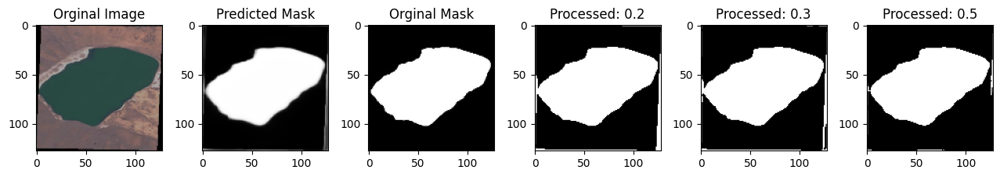

67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 319ms/step - accuracy: 0.7277 - loss: 0.2838 - val_accuracy: 0.7303 - val_loss: 0.2773
Epoch 36/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/steptep - accuracy: 0.7272 - loss: 0.274


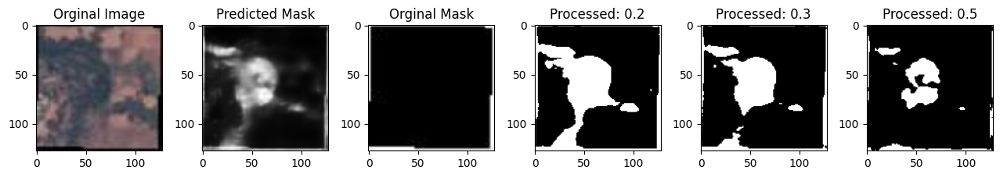

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 292ms/step - accuracy: 0.7272 - loss: 0.2740 - val_accuracy: 0.7278 - val_loss: 0.2840
Epoch 37/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/steptep - accuracy: 0.7359 - loss: 0.269


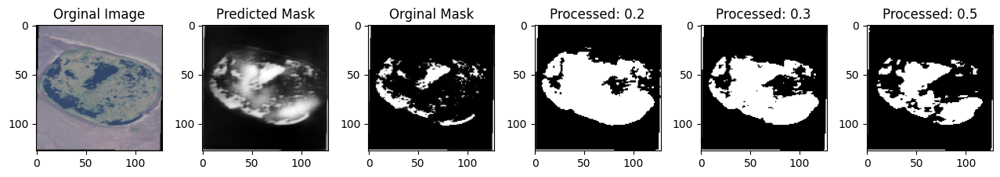

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 290ms/step - accuracy: 0.7359 - loss: 0.2697 - val_accuracy: 0.7294 - val_loss: 0.2798
Epoch 38/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/steptep - accuracy: 0.7322 - loss: 0.270


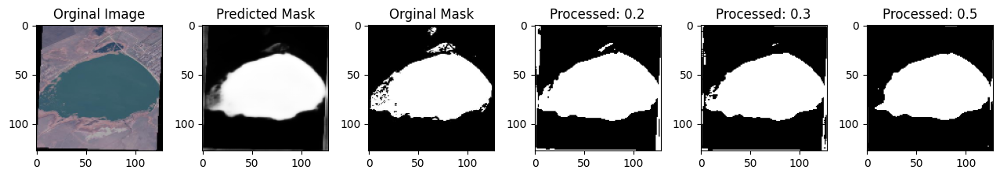

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 299ms/step - accuracy: 0.7322 - loss: 0.2703 - val_accuracy: 0.7336 - val_loss: 0.2715
Epoch 39/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/steptep - accuracy: 0.7294 - loss: 0.268


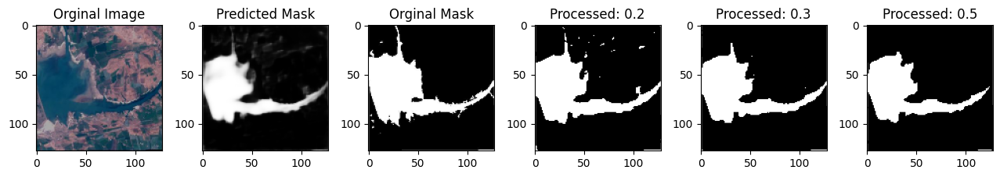

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 301ms/step - accuracy: 0.7295 - loss: 0.2688 - val_accuracy: 0.7340 - val_loss: 0.2726
Epoch 40/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/steptep - accuracy: 0.7314 - loss: 0.280


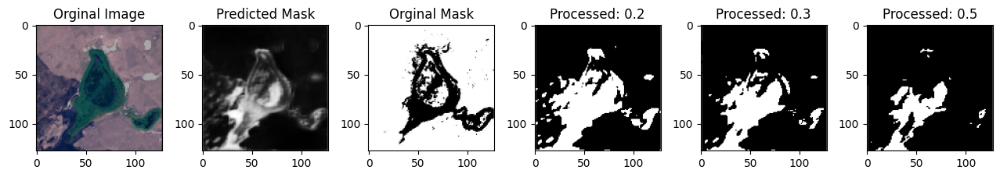

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 294ms/step - accuracy: 0.7314 - loss: 0.2805 - val_accuracy: 0.7356 - val_loss: 0.2657
Epoch 41/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/steptep - accuracy: 0.7317 - loss: 0.266


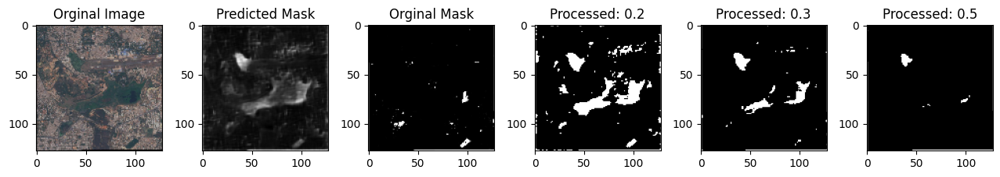

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 284ms/step - accuracy: 0.7317 - loss: 0.2666 - val_accuracy: 0.7361 - val_loss: 0.2607
Epoch 42/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/steptep - accuracy: 0.7401 - loss: 0.249


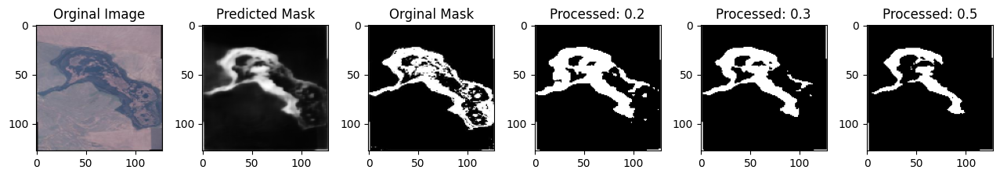

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 297ms/step - accuracy: 0.7400 - loss: 0.2492 - val_accuracy: 0.7334 - val_loss: 0.2763
Epoch 43/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/steptep - accuracy: 0.7318 - loss: 0.271


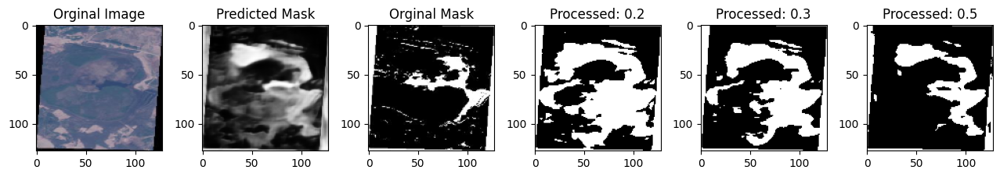

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 287ms/step - accuracy: 0.7319 - loss: 0.2713 - val_accuracy: 0.7343 - val_loss: 0.2658
Epoch 44/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/steptep - accuracy: 0.7325 - loss: 0.262


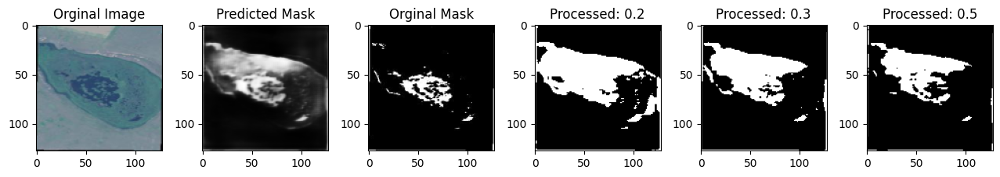

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 281ms/step - accuracy: 0.7325 - loss: 0.2622 - val_accuracy: 0.7356 - val_loss: 0.2661
Epoch 45/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/steptep - accuracy: 0.7459 - loss: 0.242


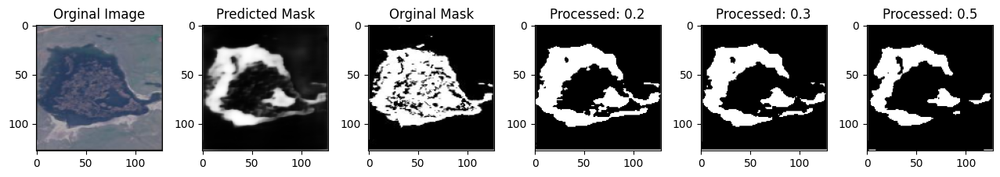

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 291ms/step - accuracy: 0.7458 - loss: 0.2422 - val_accuracy: 0.7392 - val_loss: 0.2652
Epoch 46/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/steptep - accuracy: 0.7415 - loss: 0.249


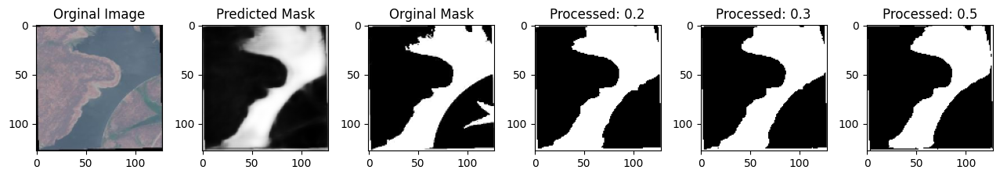

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 286ms/step - accuracy: 0.7414 - loss: 0.2494 - val_accuracy: 0.7317 - val_loss: 0.2728
Epoch 47/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/steptep - accuracy: 0.7394 - loss: 0.257


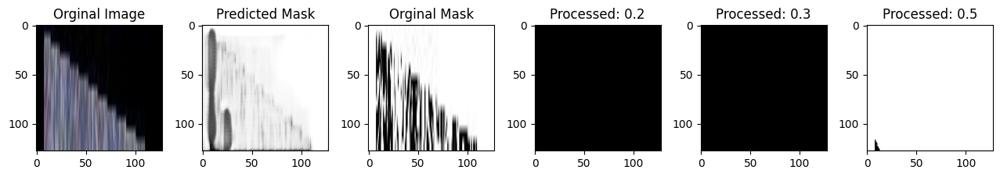

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 293ms/step - accuracy: 0.7394 - loss: 0.2577 - val_accuracy: 0.7358 - val_loss: 0.2817
Epoch 48/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/steptep - accuracy: 0.7404 - loss: 0.251


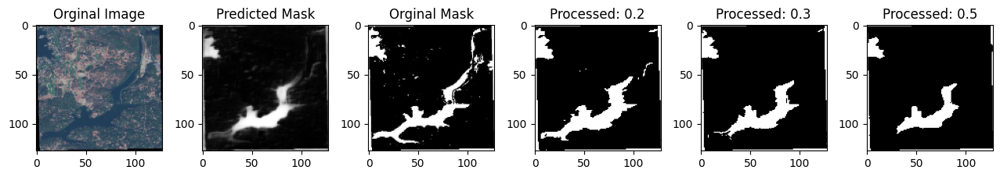

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 292ms/step - accuracy: 0.7404 - loss: 0.2511 - val_accuracy: 0.7323 - val_loss: 0.2766
Epoch 49/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/steptep - accuracy: 0.7396 - loss: 0.247


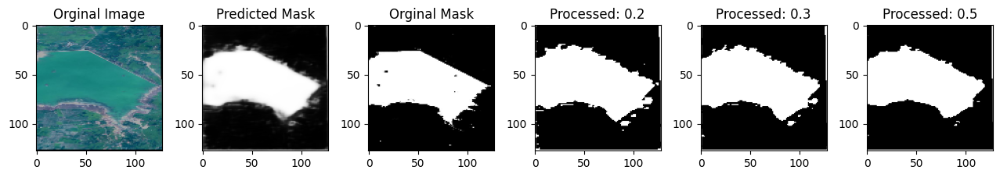

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 286ms/step - accuracy: 0.7396 - loss: 0.2473 - val_accuracy: 0.7360 - val_loss: 0.2616
Epoch 50/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/steptep - accuracy: 0.7410 - loss: 0.244


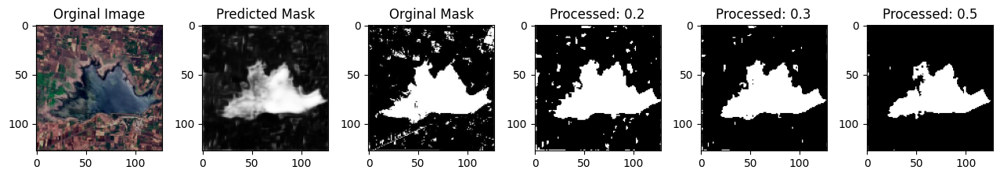

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 285ms/step - accuracy: 0.7410 - loss: 0.2449 - val_accuracy: 0.7371 - val_loss: 0.2580
Epoch 51/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/steptep - accuracy: 0.7360 - loss: 0.254


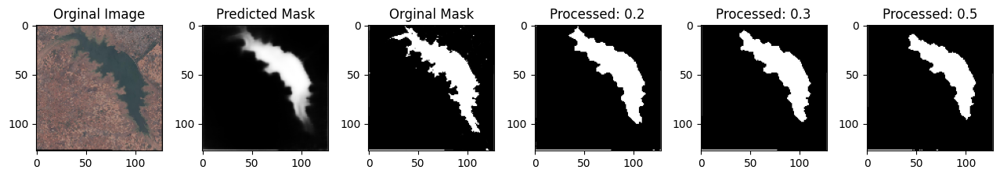

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 298ms/step - accuracy: 0.7360 - loss: 0.2542 - val_accuracy: 0.7316 - val_loss: 0.2838
Epoch 52/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/steptep - accuracy: 0.7454 - loss: 0.246


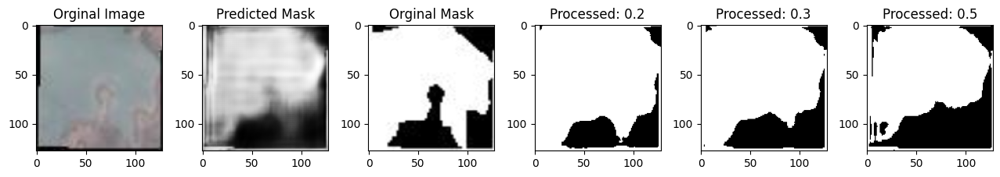

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 289ms/step - accuracy: 0.7453 - loss: 0.2463 - val_accuracy: 0.7390 - val_loss: 0.2528
Epoch 53/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/steptep - accuracy: 0.7384 - loss: 0.248


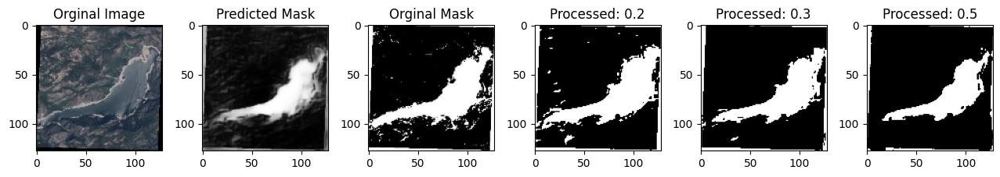

67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 309ms/step - accuracy: 0.7384 - loss: 0.2479 - val_accuracy: 0.7384 - val_loss: 0.2572
Epoch 54/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/steptep - accuracy: 0.7358 - loss: 0.246


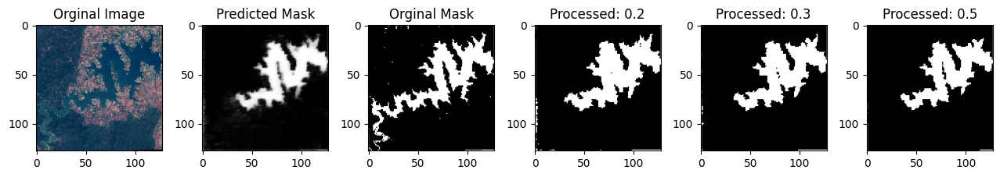

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 293ms/step - accuracy: 0.7358 - loss: 0.2462 - val_accuracy: 0.7371 - val_loss: 0.2627
Epoch 55/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/steptep - accuracy: 0.7425 - loss: 0.240


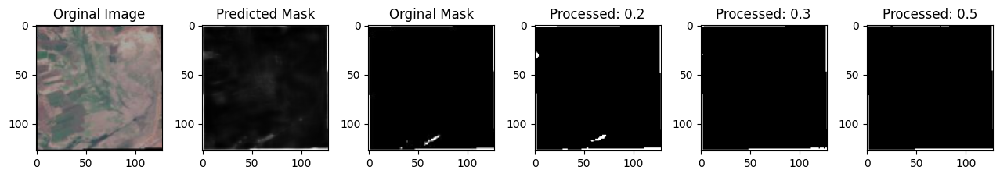

67/67 ━━━━━━━━━━━━━━━━━━━━ 22s 321ms/step - accuracy: 0.7425 - loss: 0.2404 - val_accuracy: 0.7428 - val_loss: 0.2584
Epoch 56/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/steptep - accuracy: 0.7439 - loss: 0.239


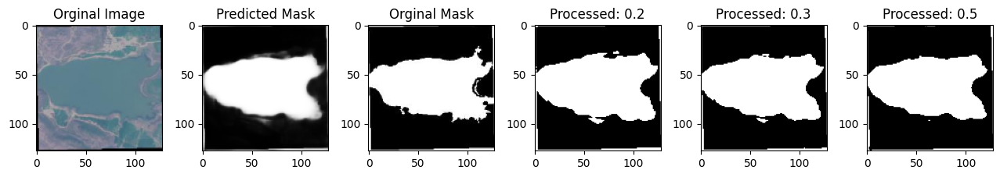

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 302ms/step - accuracy: 0.7439 - loss: 0.2398 - val_accuracy: 0.7412 - val_loss: 0.2533
Epoch 57/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/steptep - accuracy: 0.7446 - loss: 0.241


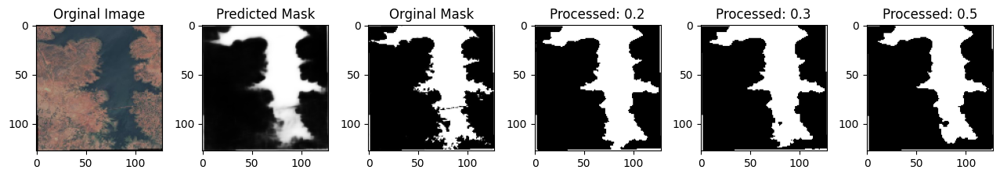

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 302ms/step - accuracy: 0.7446 - loss: 0.2415 - val_accuracy: 0.7364 - val_loss: 0.2635
Epoch 58/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/steptep - accuracy: 0.7429 - loss: 0.236


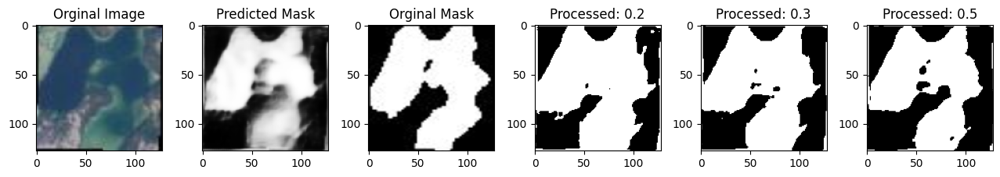

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 299ms/step - accuracy: 0.7429 - loss: 0.2361 - val_accuracy: 0.7391 - val_loss: 0.2581
Epoch 59/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/steptep - accuracy: 0.7356 - loss: 0.250


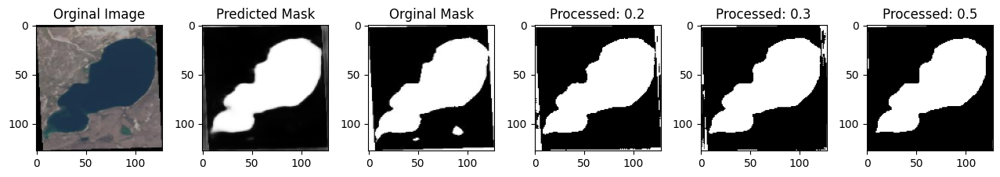

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 289ms/step - accuracy: 0.7357 - loss: 0.2504 - val_accuracy: 0.7392 - val_loss: 0.2518
Epoch 60/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/steptep - accuracy: 0.7371 - loss: 0.240


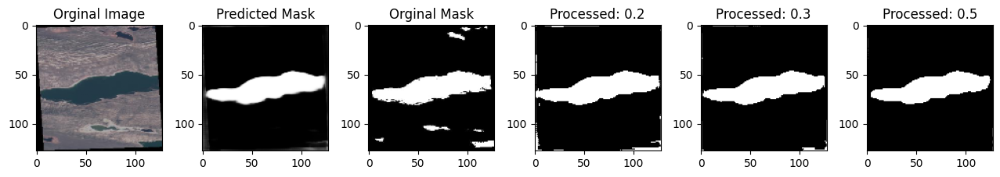

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 282ms/step - accuracy: 0.7372 - loss: 0.2404 - val_accuracy: 0.7426 - val_loss: 0.2740
Epoch 61/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/steptep - accuracy: 0.7483 - loss: 0.233


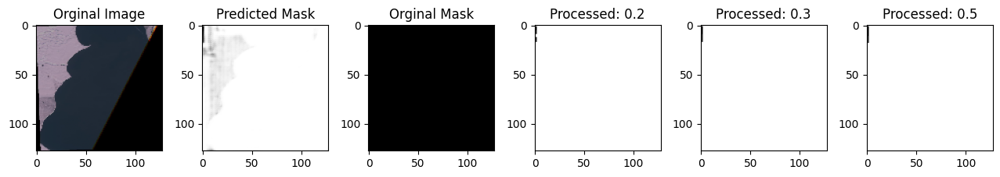

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 298ms/step - accuracy: 0.7483 - loss: 0.2335 - val_accuracy: 0.7401 - val_loss: 0.2493
Epoch 62/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/steptep - accuracy: 0.7496 - loss: 0.222


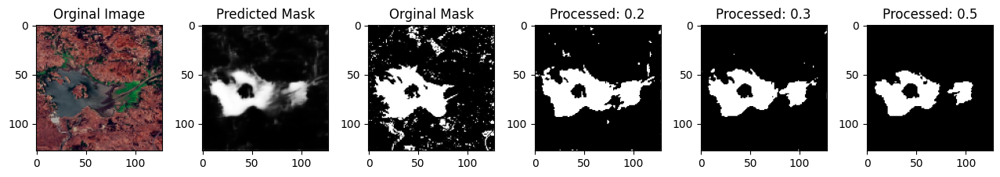

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 287ms/step - accuracy: 0.7495 - loss: 0.2231 - val_accuracy: 0.7341 - val_loss: 0.2865
Epoch 63/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/steptep - accuracy: 0.7473 - loss: 0.233


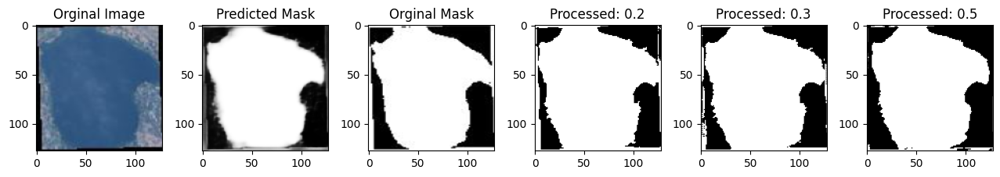

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 288ms/step - accuracy: 0.7473 - loss: 0.2336 - val_accuracy: 0.7407 - val_loss: 0.2553
Epoch 64/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/steptep - accuracy: 0.7447 - loss: 0.231


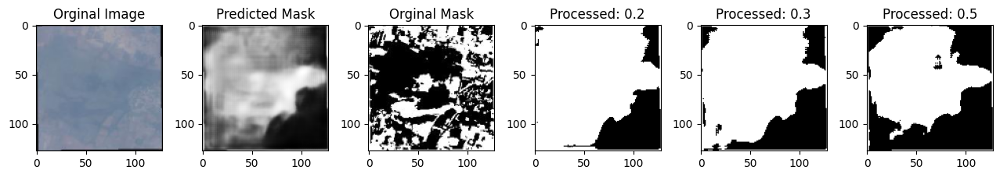

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 303ms/step - accuracy: 0.7447 - loss: 0.2311 - val_accuracy: 0.7440 - val_loss: 0.2469
Epoch 65/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/steptep - accuracy: 0.7434 - loss: 0.220


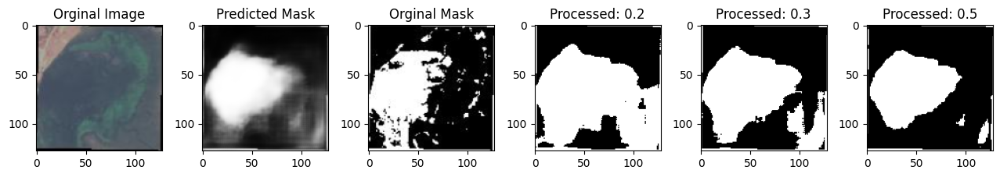

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 289ms/step - accuracy: 0.7434 - loss: 0.2207 - val_accuracy: 0.7409 - val_loss: 0.2566
Epoch 66/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/steptep - accuracy: 0.7481 - loss: 0.219


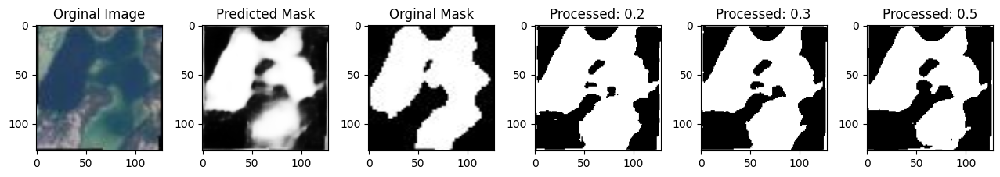

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 300ms/step - accuracy: 0.7481 - loss: 0.2194 - val_accuracy: 0.7419 - val_loss: 0.2548
Epoch 67/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/steptep - accuracy: 0.7418 - loss: 0.223


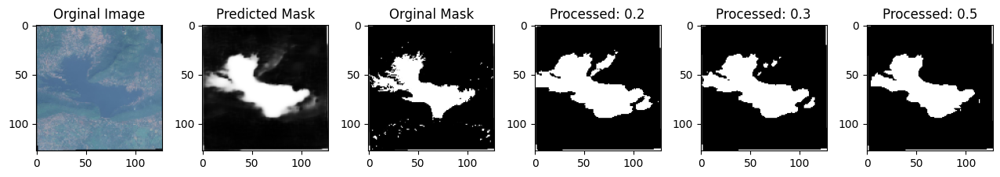

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 289ms/step - accuracy: 0.7419 - loss: 0.2239 - val_accuracy: 0.7426 - val_loss: 0.2455
Epoch 68/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/steptep - accuracy: 0.7552 - loss: 0.212


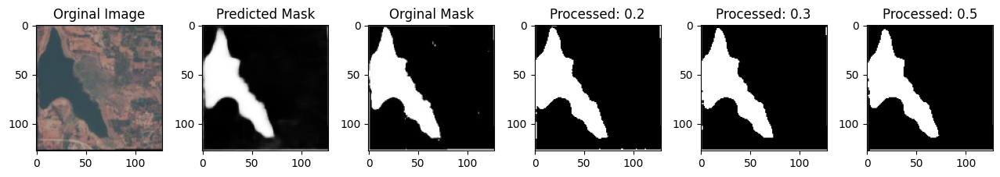

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 299ms/step - accuracy: 0.7551 - loss: 0.2123 - val_accuracy: 0.7392 - val_loss: 0.2865
Epoch 69/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/steptep - accuracy: 0.7518 - loss: 0.219


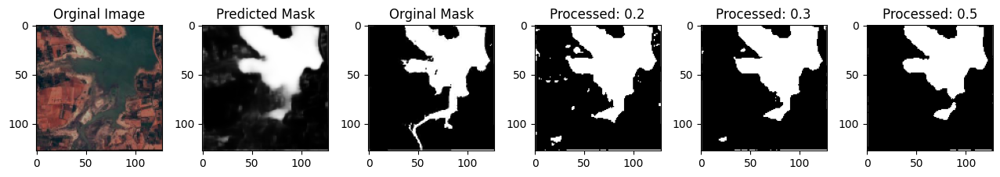

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 303ms/step - accuracy: 0.7517 - loss: 0.2200 - val_accuracy: 0.7404 - val_loss: 0.2553
Epoch 70/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/steptep - accuracy: 0.7474 - loss: 0.228


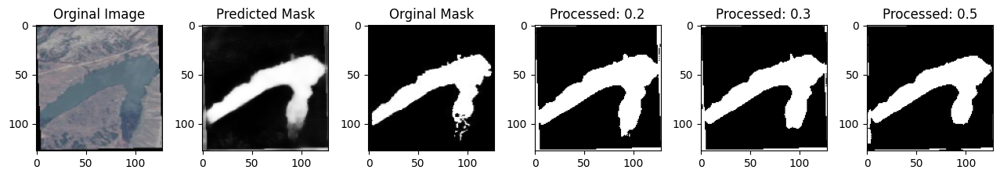

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 295ms/step - accuracy: 0.7474 - loss: 0.2280 - val_accuracy: 0.7427 - val_loss: 0.2518
Epoch 71/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/steptep - accuracy: 0.7485 - loss: 0.227


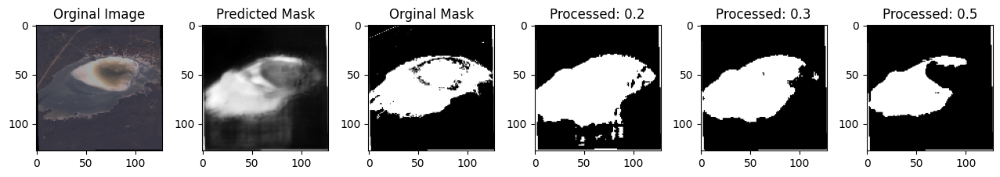

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 298ms/step - accuracy: 0.7485 - loss: 0.2272 - val_accuracy: 0.7413 - val_loss: 0.2508
Epoch 72/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/steptep - accuracy: 0.7522 - loss: 0.216


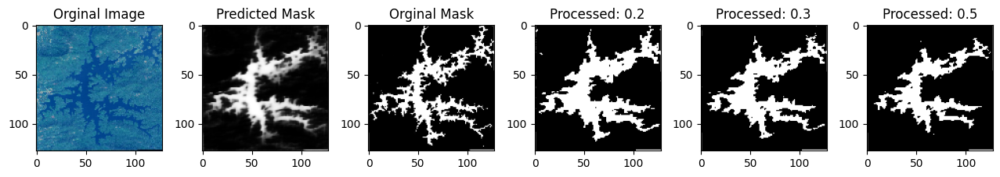

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 291ms/step - accuracy: 0.7521 - loss: 0.2168 - val_accuracy: 0.7394 - val_loss: 0.2557
Epoch 73/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/steptep - accuracy: 0.7493 - loss: 0.219


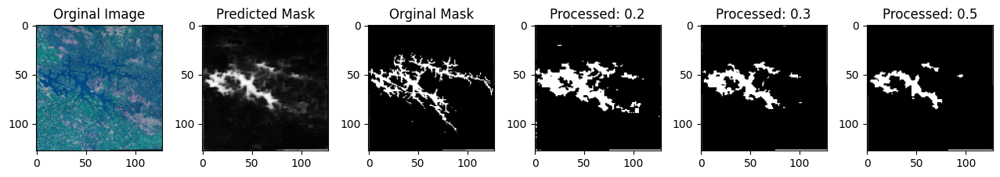

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 295ms/step - accuracy: 0.7493 - loss: 0.2199 - val_accuracy: 0.7421 - val_loss: 0.2452
Epoch 74/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/steptep - accuracy: 0.7453 - loss: 0.224


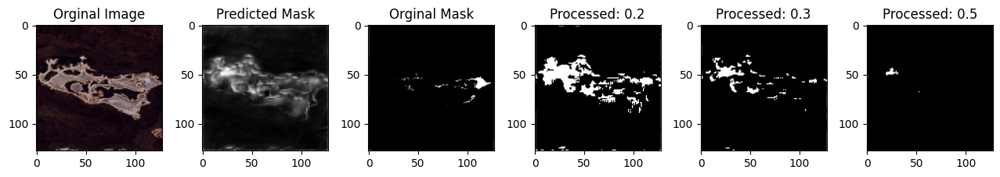

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 294ms/step - accuracy: 0.7453 - loss: 0.2248 - val_accuracy: 0.7401 - val_loss: 0.2517
Epoch 75/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/steptep - accuracy: 0.7450 - loss: 0.223


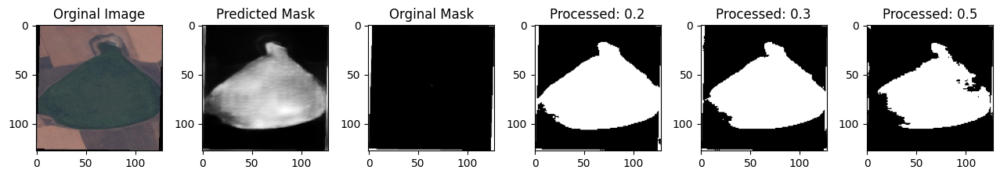

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 295ms/step - accuracy: 0.7450 - loss: 0.2239 - val_accuracy: 0.7422 - val_loss: 0.2496
Epoch 76/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/steptep - accuracy: 0.7461 - loss: 0.224


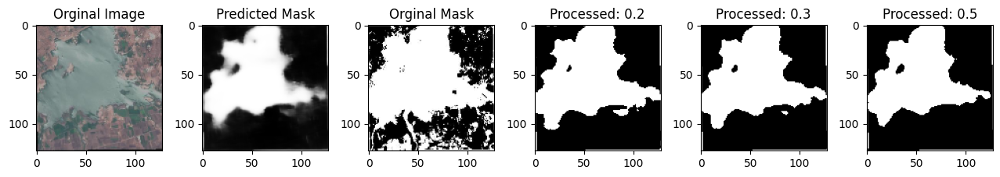

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 297ms/step - accuracy: 0.7462 - loss: 0.2243 - val_accuracy: 0.7410 - val_loss: 0.3183
Epoch 77/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/steptep - accuracy: 0.7206 - loss: 0.305


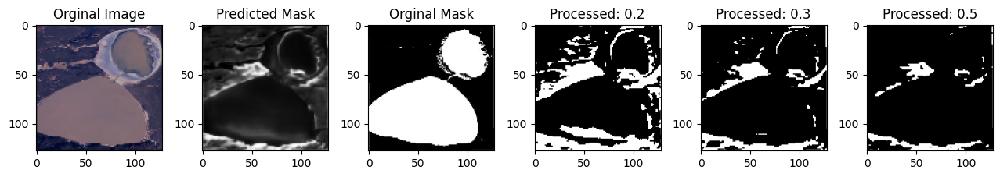

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 294ms/step - accuracy: 0.7205 - loss: 0.3060 - val_accuracy: 0.7327 - val_loss: 0.2773
Epoch 78/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/steptep - accuracy: 0.7290 - loss: 0.271


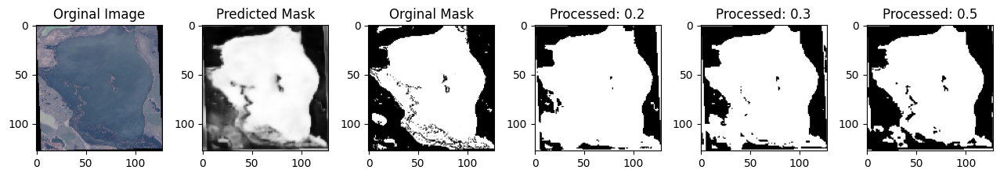

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 298ms/step - accuracy: 0.7290 - loss: 0.2717 - val_accuracy: 0.7248 - val_loss: 0.2904
Epoch 79/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/steptep - accuracy: 0.7401 - loss: 0.258


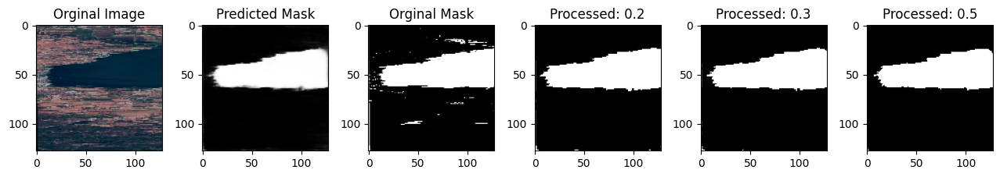

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 299ms/step - accuracy: 0.7400 - loss: 0.2581 - val_accuracy: 0.7375 - val_loss: 0.2837
Epoch 80/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/steptep - accuracy: 0.7354 - loss: 0.236


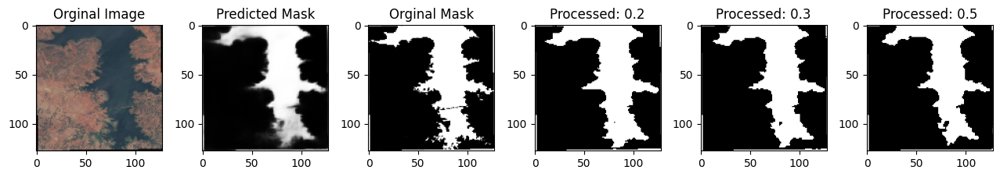

67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 313ms/step - accuracy: 0.7356 - loss: 0.2367 - val_accuracy: 0.7351 - val_loss: 0.2815
Epoch 81/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/steptep - accuracy: 0.7495 - loss: 0.228


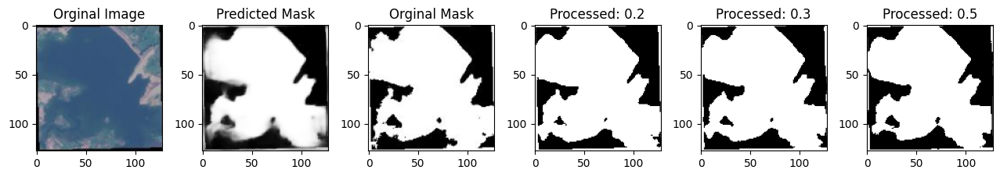

67/67 ━━━━━━━━━━━━━━━━━━━━ 21s 316ms/step - accuracy: 0.7495 - loss: 0.2281 - val_accuracy: 0.7438 - val_loss: 0.2570
Epoch 82/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/steptep - accuracy: 0.7453 - loss: 0.219


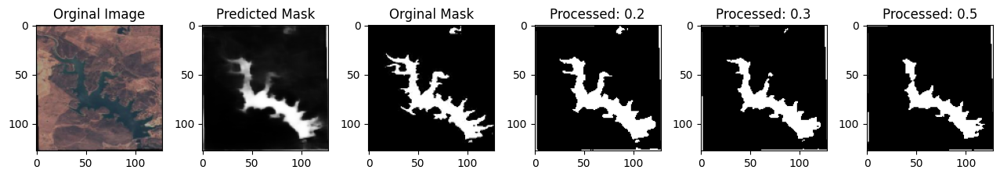

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 299ms/step - accuracy: 0.7453 - loss: 0.2193 - val_accuracy: 0.7405 - val_loss: 0.2524
Epoch 83/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/steptep - accuracy: 0.7501 - loss: 0.219


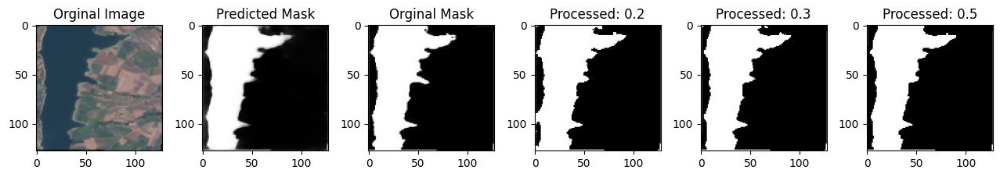

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 290ms/step - accuracy: 0.7501 - loss: 0.2193 - val_accuracy: 0.7410 - val_loss: 0.2516
Epoch 84/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/steptep - accuracy: 0.7475 - loss: 0.215


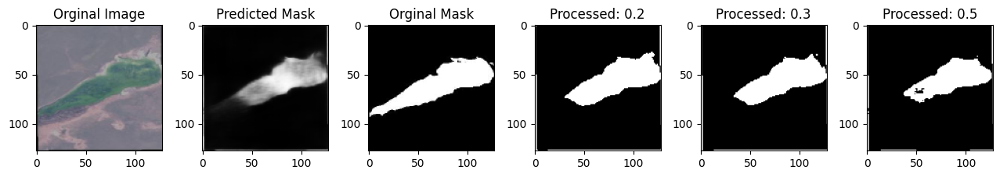

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 284ms/step - accuracy: 0.7475 - loss: 0.2158 - val_accuracy: 0.7434 - val_loss: 0.2589
Epoch 85/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/steptep - accuracy: 0.7538 - loss: 0.206


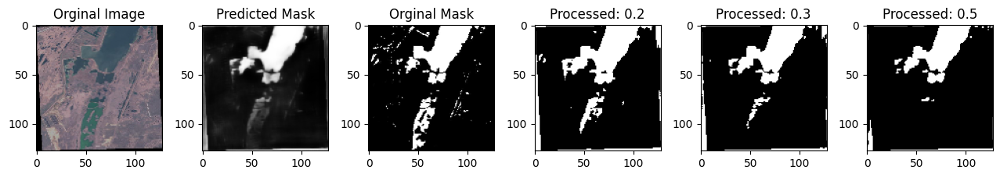

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 284ms/step - accuracy: 0.7538 - loss: 0.2068 - val_accuracy: 0.7406 - val_loss: 0.2484
Epoch 86/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/steptep - accuracy: 0.7516 - loss: 0.209


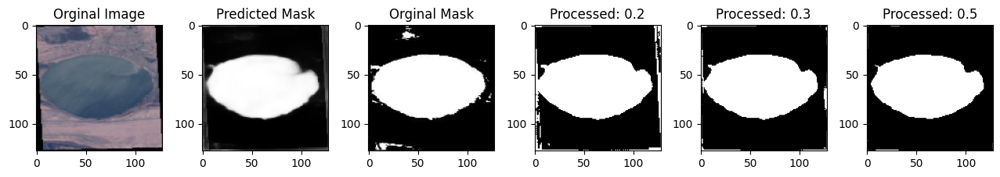

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 280ms/step - accuracy: 0.7516 - loss: 0.2094 - val_accuracy: 0.7389 - val_loss: 0.2614
Epoch 87/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/steptep - accuracy: 0.7490 - loss: 0.215


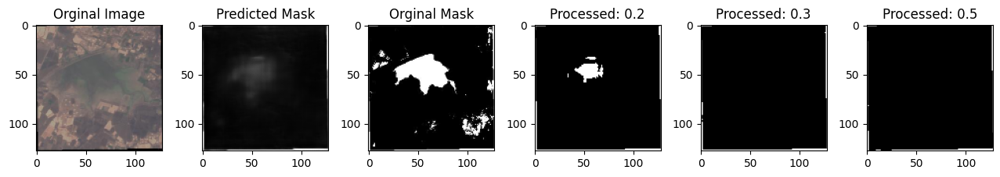

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 276ms/step - accuracy: 0.7490 - loss: 0.2157 - val_accuracy: 0.7424 - val_loss: 0.2522
Epoch 88/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/steptep - accuracy: 0.7387 - loss: 0.223


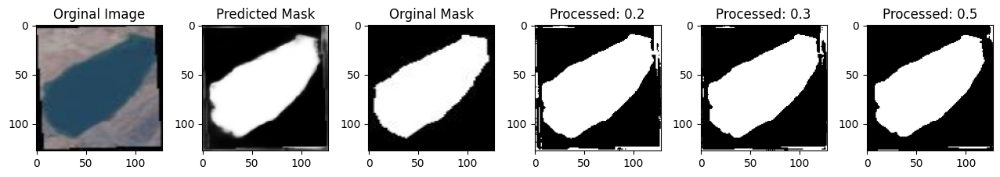

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 283ms/step - accuracy: 0.7388 - loss: 0.2231 - val_accuracy: 0.7448 - val_loss: 0.2462
Epoch 89/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/steptep - accuracy: 0.7477 - loss: 0.219


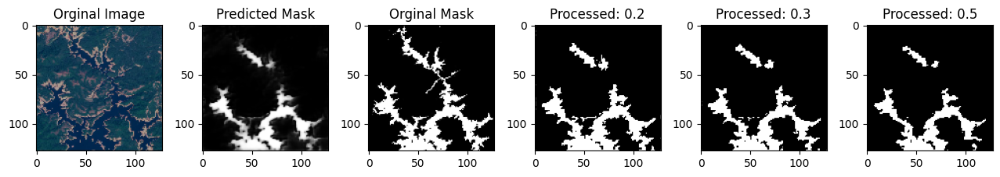

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 290ms/step - accuracy: 0.7478 - loss: 0.2193 - val_accuracy: 0.7464 - val_loss: 0.2491
Epoch 90/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/steptep - accuracy: 0.7576 - loss: 0.209


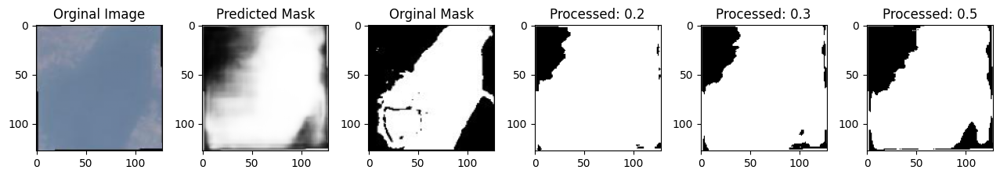

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 283ms/step - accuracy: 0.7575 - loss: 0.2094 - val_accuracy: 0.7417 - val_loss: 0.2697
Epoch 91/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/steptep - accuracy: 0.7495 - loss: 0.220


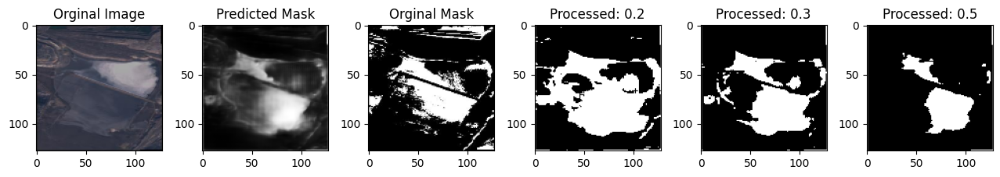

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 303ms/step - accuracy: 0.7495 - loss: 0.2205 - val_accuracy: 0.7421 - val_loss: 0.2545
Epoch 92/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/steptep - accuracy: 0.7431 - loss: 0.207


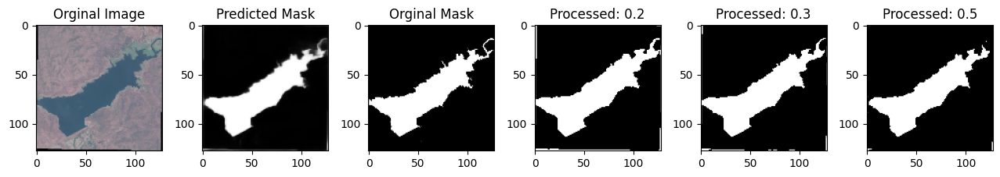

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 297ms/step - accuracy: 0.7432 - loss: 0.2076 - val_accuracy: 0.7431 - val_loss: 0.2483
Epoch 93/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/steptep - accuracy: 0.7561 - loss: 0.202


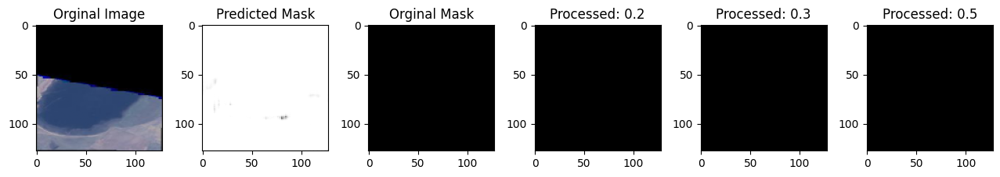

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 296ms/step - accuracy: 0.7561 - loss: 0.2020 - val_accuracy: 0.7426 - val_loss: 0.2467
Epoch 94/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/steptep - accuracy: 0.7547 - loss: 0.203


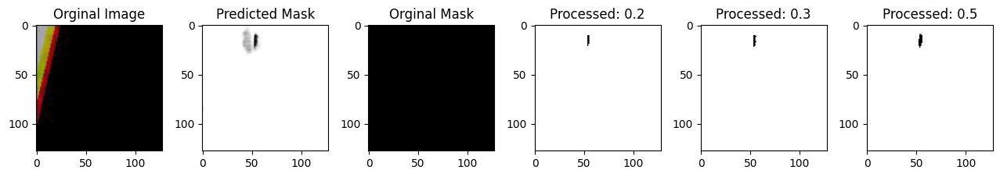

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 300ms/step - accuracy: 0.7546 - loss: 0.2035 - val_accuracy: 0.7427 - val_loss: 0.2501
Epoch 95/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/steptep - accuracy: 0.7524 - loss: 0.207


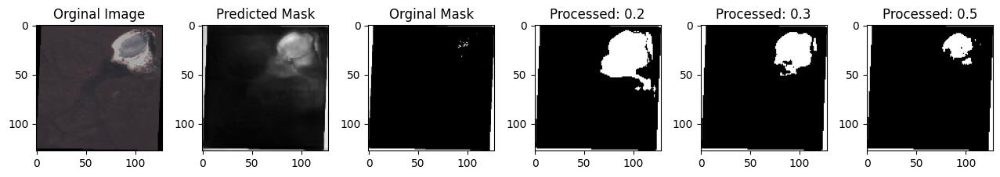

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 296ms/step - accuracy: 0.7523 - loss: 0.2076 - val_accuracy: 0.7364 - val_loss: 0.2673
Epoch 96/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/steptep - accuracy: 0.7454 - loss: 0.235


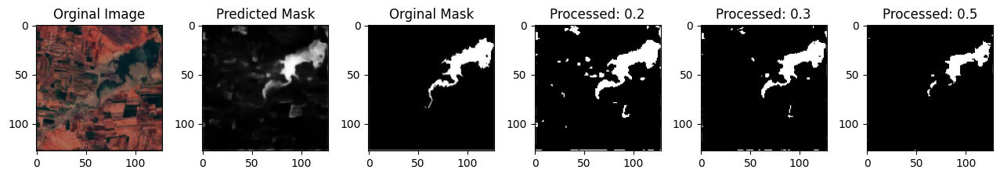

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 283ms/step - accuracy: 0.7454 - loss: 0.2356 - val_accuracy: 0.7433 - val_loss: 0.2491
Epoch 97/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/steptep - accuracy: 0.7502 - loss: 0.208


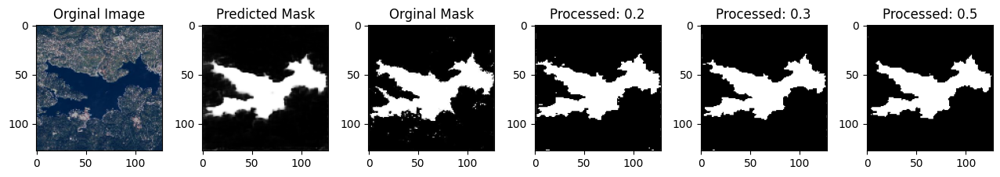

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 288ms/step - accuracy: 0.7502 - loss: 0.2082 - val_accuracy: 0.7455 - val_loss: 0.2450
Epoch 98/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/steptep - accuracy: 0.7570 - loss: 0.197


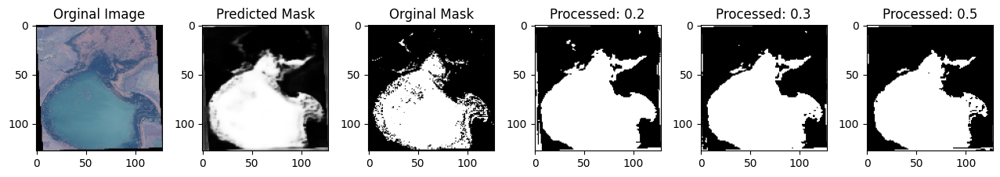

67/67 ━━━━━━━━━━━━━━━━━━━━ 18s 275ms/step - accuracy: 0.7569 - loss: 0.1981 - val_accuracy: 0.7460 - val_loss: 0.2480
Epoch 99/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/steptep - accuracy: 0.7528 - loss: 0.203


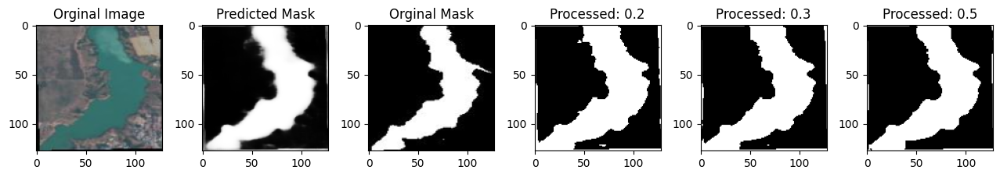

67/67 ━━━━━━━━━━━━━━━━━━━━ 20s 292ms/step - accuracy: 0.7528 - loss: 0.2035 - val_accuracy: 0.7437 - val_loss: 0.2584
Epoch 100/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/steptep - accuracy: 0.7581 - loss: 0.195


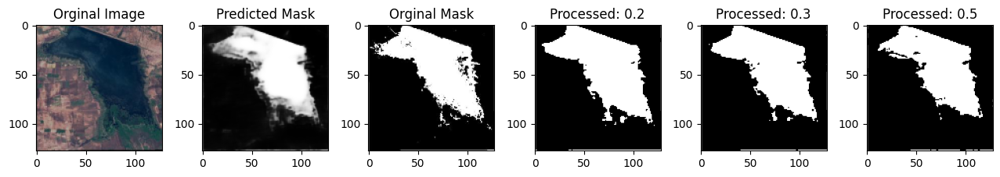

67/67 ━━━━━━━━━━━━━━━━━━━━ 19s 285ms/step - accuracy: 0.7581 - loss: 0.1960 - val_accuracy: 0.7423 - val_loss: 0.2516


In [16]:
# Training
epochs = 100
batch_size = 32

history = model.fit(images_train, mask_train,
                    validation_data=[images_test, mask_test], 
                    epochs=epochs,
                    callbacks=[ShowProgress()],
                    batch_size=batch_size)

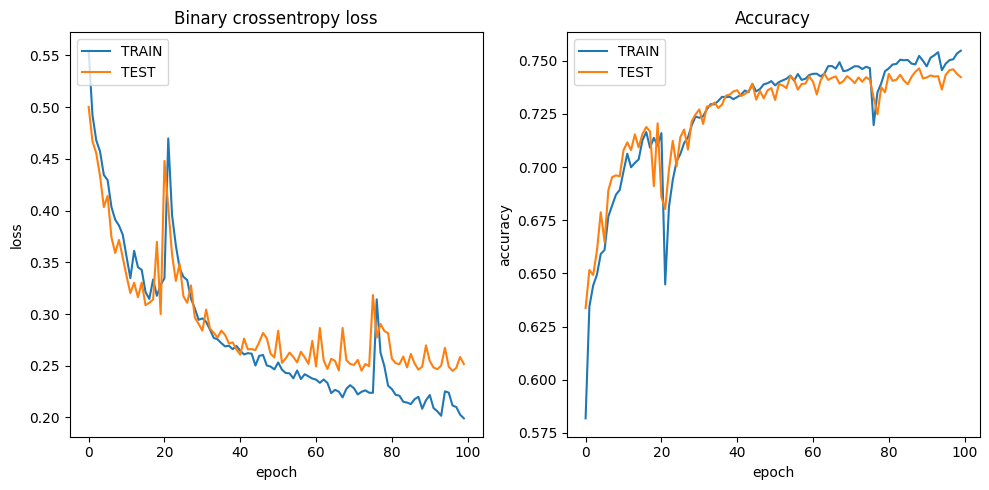

In [17]:
plt.figure(figsize=(10,5))

# Plot loss for each epoch
plt.subplot(1,2,1)
plt.plot(history.history['loss'], label="Train loss")
plt.plot(history.history['val_loss'], label="Test loss")
plt.title('Binary crossentropy loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['TRAIN', 'TEST'], loc='upper left')

# Plot accuracy for each epoch
plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], label="Train accuracy")
plt.plot(history.history['val_accuracy'], label="Test accuracy")
plt.title('Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['TRAIN', 'TEST'], loc='upper left')

plt.tight_layout()
plt.show()

In [18]:
# Make predictions
predictions = model.predict(images_test)

23/23 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step


In [19]:
def plot_results(threshold=0.5):
    k = np.random.randint(len(images_test))
    original_image = images_test[k]
    mask = mask_test[k].reshape(128,128)
    predicted_mask = predictions[k].reshape(128,128)
    threshold_mask = mask_threshold(predicted_mask, threshold=threshold)

    plt.figure(figsize=(15,5))

    plt.subplot(1,4,1)
    plt.imshow(original_image);plt.title('Orginal Image')

    plt.subplot(1,4,2)
    plt.imshow(mask, cmap='gray');plt.title('Original Mask')

    plt.subplot(1,4,3)
    plt.imshow(predicted_mask, cmap='gray');plt.title('Predicted Mask')
    
    plt.subplot(1,4,4)
    plt.imshow(threshold_mask, cmap='gray');plt.title(f'Predicted Mask with cutoff={threshold}')

    plt.tight_layout()
    plt.show()

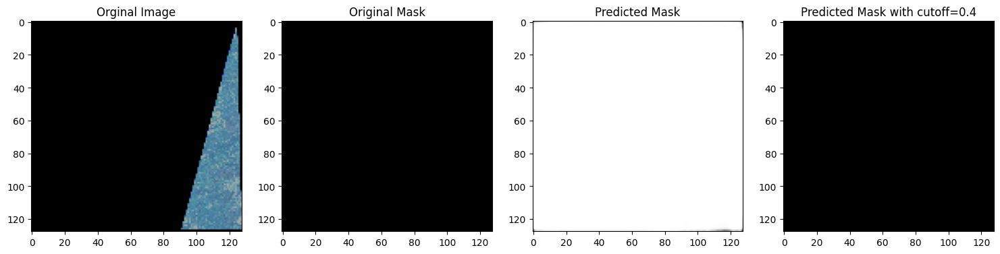

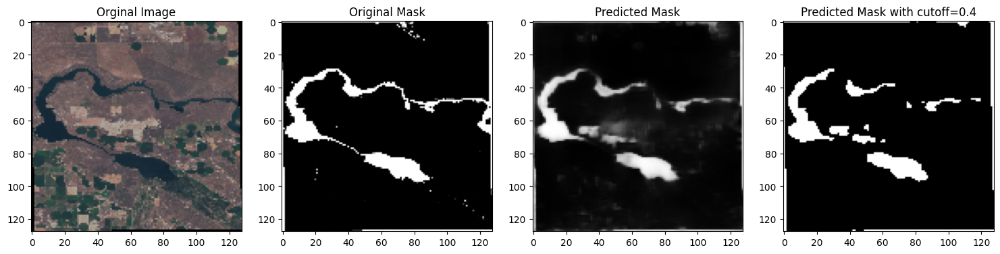

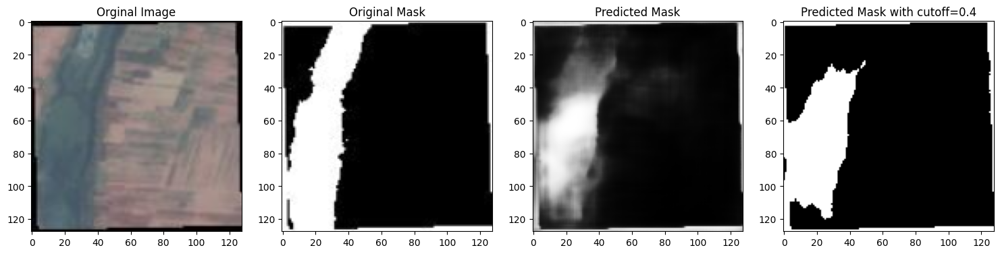

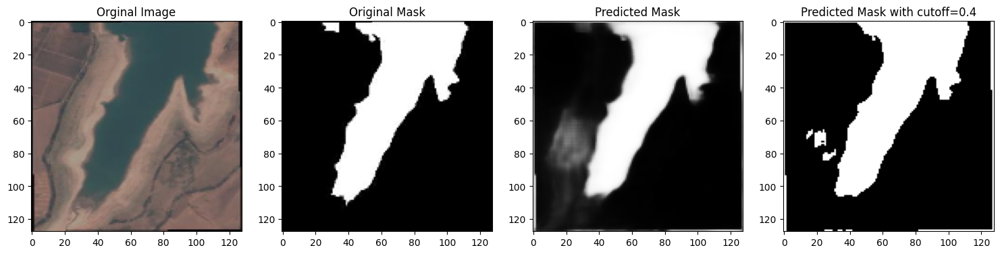

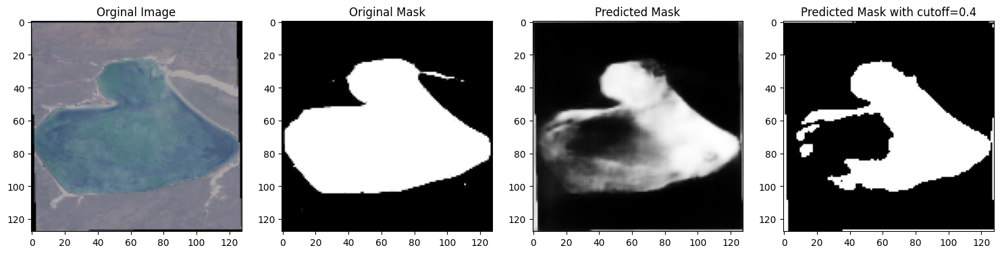

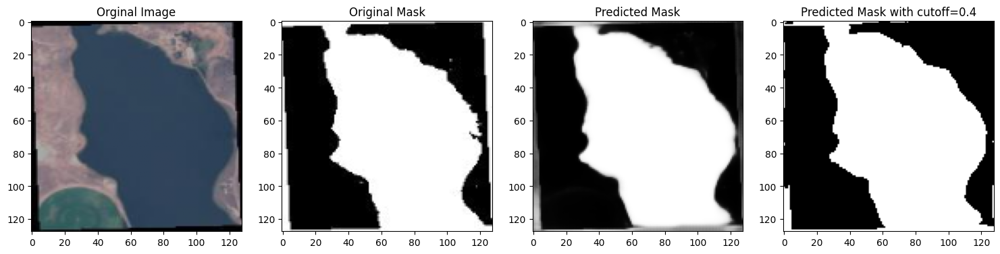

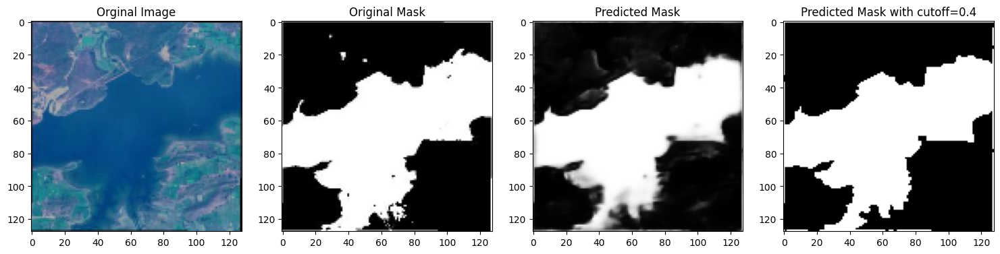

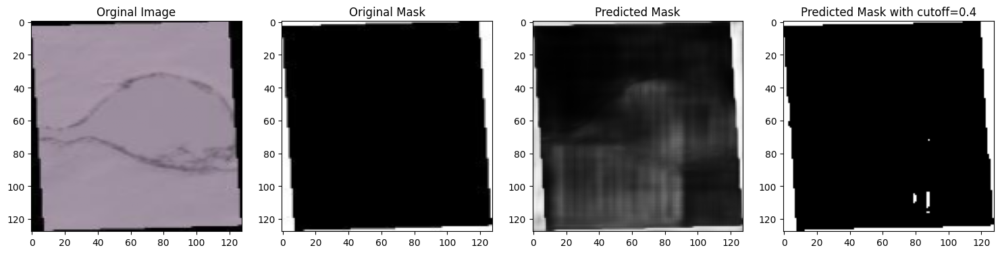

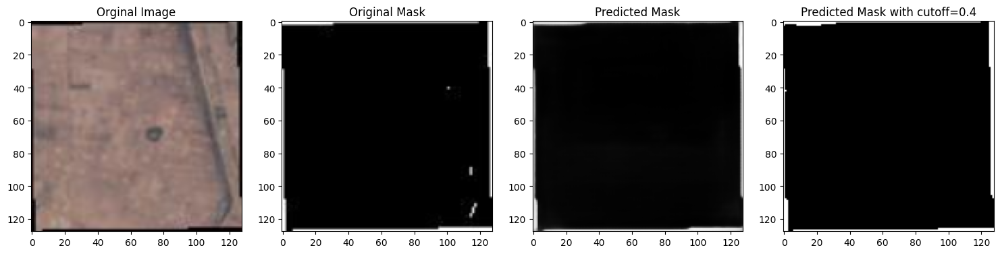

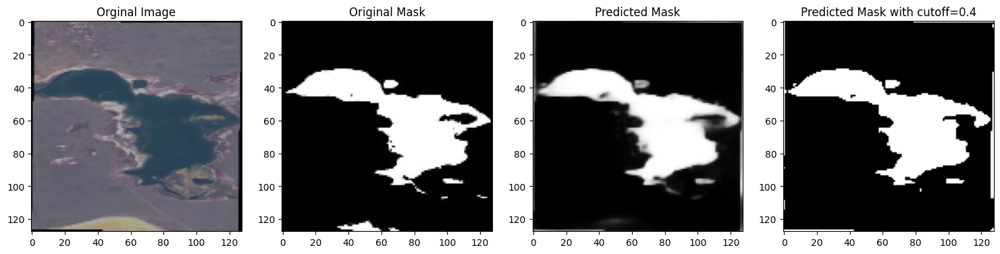

In [20]:
# Plot results on test data
for i in range(10):
  plot_results(threshold=0.4)